Project 4: Generative Adversarial Networks
======
In this project, you are expected to fill in the missing parts of a PyTorch implementation of the Deep Convolutional Generative Adversarial Network (DCGAN) [1] and test its performance on several datasets.<br>
Please **read the instructions carefully**. We provide reference outputs for most tasks and we will judge your solution based on your code as well as on the quality of your output and similarity to our results.

We will be using datasets with small images for this project, because high-resolution GANs take notoriously long to train.

**References:**

[1] [Radford, A., Metz, L. and Chintala, S., 2015. Unsupervised representation learning with deep convolutional generative adversarial networks. arXiv preprint arXiv:1511.06434.](https://arxiv.org/abs/1511.06434)

[2] [MNIST dataset.](http://yann.lecun.com/exdb/mnist/)

[3] [FashionMNIST dataset.](https://github.com/zalandoresearch/fashion-mnist)

[4] [UTKFace dataset.](https://susanqq.github.io/UTKFace/)

!unzip img.zip

## Assignment 4A: DCGAN

### Verify your PyTorch installation

In [73]:
import torch
import torchvision

# Print Basic Information
print('Torch', torch.__version__, 'CUDA', torch.version.cuda)
print("Torchvision", torchvision.__version__)
print('Device:', torch.device('cuda:0'))
device = torch.device("cuda:0")

Torch 1.3.0 CUDA 10.1.243
Torchvision 0.4.1
Device: cuda:0


In [74]:
#import statements
import os, time
import matplotlib.pyplot as plt
import itertools
import pickle
import imageio
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms, utils
from torch.autograd import Variable
from torchsummary import summary
import numpy as np

In [ ]:
# !pip install torchsummary

### 2) Choose appropriate hyperparameters for the training (4 points)

In [89]:
#######################################################################################################
# TODO 2: choose sensible training parameters for DCGAN training. 
# Start with few epochs while you design the network, and increase once you think you have a good setup.
# Since GANs train slowly, you may have to use at quite a few epochs to see good results.
#######################################################################################################
batch_size = 256
lr = 0.0002
num_epochs = 20

In [83]:
#######################################################################################################
# TODO 3a: implement a function that initializes the layer's weights with mean and standard deviation.
#######################################################################################################

def normal_init(layer, mean, std):
# def normal_init(m):
    # no bias need?
#     classname = m.__class__.__name__
#     print(classname)
    nn.init.normal_(layer.weight.data, mean, std)

In [84]:
#######################################################################################################
# TODO 3b: implement the generator network for a DCGAN with output size 32x32px
#######################################################################################################
class Generator(nn.Module):
    def __init__(self, mean, std, initial_channels=512):
        super(Generator, self).__init__()
        
        # size of z input vector 100
        # number of feature maps
        # the number of output channel is 1 rather than 3
        self.icn = initial_channels
        self.deconv = nn.Sequential(
            # 4,1,0 represents kernel size, stride and padding respectively
            # (100,1,1)
            nn.ConvTranspose2d(100,self.icn,4,1,0,bias=False),
            nn.BatchNorm2d(self.icn),
            nn.ReLU(True),
            # (1024,4,4)
            nn.ConvTranspose2d(self.icn,self.icn//2,4,2,1,bias=False),
            nn.BatchNorm2d(self.icn//2),
            nn.ReLU(True),
            # (512,8,8)
            nn.ConvTranspose2d(self.icn//2,self.icn//4,4,2,1,bias=False),
            nn.BatchNorm2d(self.icn//4),
            nn.ReLU(True),
            # (256,16,16)
            nn.ConvTranspose2d(self.icn//4,self.icn//8,4,2,1,bias=False),
            nn.BatchNorm2d(self.icn//8),
            nn.ReLU(True),
            # (128,32,32)
            nn.ConvTranspose2d(self.icn//8,3,4,2,1,bias=False),
            nn.Tanh()
            # torch.Size([1, 3, 64, 64])
        )
        self.weight_init(mean, std)

    # forward method
    def forward(self, input_):
        # (1,1,64,64)
        return self.deconv(input_) 
    
    # weight_init
    def weight_init(self, mean, std):
        for layer in self.deconv:
            layer_name = type(layer).__name__
            if layer_name == 'ConvTranspose2d':
                # normalize the transpose convolutional layers
                normal_init(layer, mean, std)
            else:
                continue

In [16]:
# fixed_noise = torch.randn(1, 100, 1, 1)
# G = Generator(0,0.02)
# # should it be 512 or 256?
# # should I set the initial channel number 256 or just add one more
# # convolutional layer to eliminate that? from 128 -> 64 not directly ->1?
# G(fixed_noise).shape

### 4) Implement the discriminator network (8 points)
<img src="img/DCGAN_discriminator.png" align='left' width="800">

In [85]:
#######################################################################################################
# TODO 3c: implement the discriminator network for a DCGAN with input size 32x32px
#######################################################################################################
class Discriminator(nn.Module):
    def __init__(self, mean, std, initial_channels=64):
        super(Discriminator, self).__init__()
        self.icn = initial_channels
        self.conv = nn.Sequential(
            # (1,64,64)
            nn.Conv2d(3,self.icn,4,2,1,bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # (64,32,32)
            nn.Conv2d(self.icn,self.icn*2,4,2,1,bias=False),
            nn.BatchNorm2d(self.icn*2),
            nn.LeakyReLU(0.2, inplace=True),
            # (128,16,16)
            nn.Conv2d(self.icn*2,self.icn*4,4,2,1,bias=False),
            nn.BatchNorm2d(self.icn*4),
            nn.LeakyReLU(0.2, inplace=True),
            # (256,8,8)
            nn.Conv2d(self.icn*4,self.icn*8,4,2,1,bias=False),
            nn.BatchNorm2d(self.icn*8),
            nn.LeakyReLU(0.2, inplace=True),
            # (512,4,4)
            nn.Conv2d(self.icn*8,1,4,1,0,bias=False),
            nn.Sigmoid()
        )
        self.weight_init(mean, std)

    # forward method
    def forward(self, input_):
        return self.conv(input_)
    
    # weight_init
    def weight_init(self, mean, std):
        for layer in self.conv:
            layer_name = type(layer).__name__
            if layer_name == 'Conv2d':
                # normalize the transpose convolutional layers
                normal_init(layer, mean, std)
            else:
                continue

In [19]:
# D = Discriminator(0,0.02)
# D(torch.randn(1,3,64,64)).shape

torch.Size([1, 1, 1, 1])

In [90]:
grid_size = 6
data_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

dset_name = 'myDataset_UTKFace_20_v4' #pick a meaningful name
result_dir = '{}_DCGAN'.format(dset_name)

#######################################################################################################
# TODO 4: generate a fixed noise vector to repeatedly evaluate the output of the generator 
# with the same noise vector as training progresses
#######################################################################################################
fixed_z = torch.randn(36, 100, 1, 1).to(device)
# 100 as the dimension
# output generated samples from the current state of the generator network
def show_result(num_epoch, show=False, save=False, grid_size=6, path = 'result.png', useFixed=False):
    with torch.no_grad():
        if useFixed:   
            fake = G(fixed_z).detach().cpu()
        else:
            # TODO generate a new random noise vector
            z = torch.randn(36, 100, 1, 1).to(device)
            fake = G(z).detach().cpu()

        fig, ax = plt.subplots(figsize=(8, 8))
        # the default nrow=8
        # normalization is necessary for keeping the range of each pixel valid
        image = utils.make_grid(fake.data,nrow=grid_size, padding=1,normalize=True)
        
        plt.imshow(np.transpose(image, (1, 2, 0)))    
        ax.axis('off')
        plt.savefig(path)
        if show:
            plt.show()
        else:
            plt.close()

# plot the losses over time as a curve            
def plot_losses(hist, show=True, save=False, path='progress.png'):
    x = range(len(hist['D_losses']))

    y1 = hist['D_losses']
    y2 = hist['G_losses']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Iteration')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

### 5) Training Setup (5 points) and Training Loop (10 points)

Instantiate a Generator and a Discriminator network, move networks to GPU and initialize the weights of their convolutional layers with $\mu=0$ and $\sigma=0.02$.

Create an ADAM optimizer for the generator as well as the discriminator with your chosen learning rate. Use $\beta_1=0.5$ and $\beta_2=0.999$ as described in Section 4 of the paper.

In the training loop, evaluate the output of the generator network on a random latent vector of length 100. Then, evaluate the performance of the discriminator on the generated images as well as the real image minibatch. Assign the real results the label $1$ (`torch.ones`) and the fake results the label $0$ (`torch.zeros`), then calculate the losses for each of these steps using Binary Cross Entropy loss.
        

#### Hint:
If you would like to load a stored model for additional training or for evaluation, you can do it the following way:
```
M = MyNetwork() #instantiate the network
checkpoint = torch.load("path_to_stored_network.pkl")
M.load_state_dict(checkpoint)
M.eval()
``` 

*If your model fails to train properly, include the failure cases into your report, explain what you think went wrong, and try again!*

Training ...
Epoch [1 / 20] G loss: 5.550747394561768 D loss: 0.4528585970401764


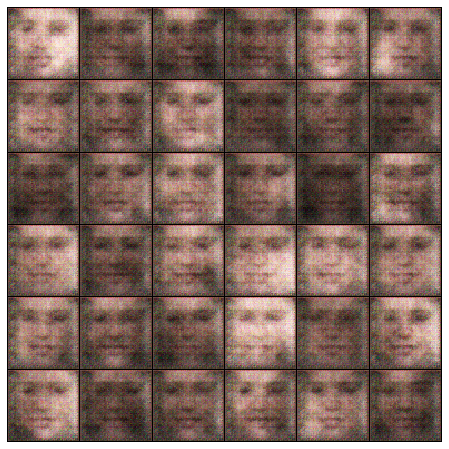

Epoch [2 / 20] G loss: 9.32319164276123 D loss: 0.6649935245513916


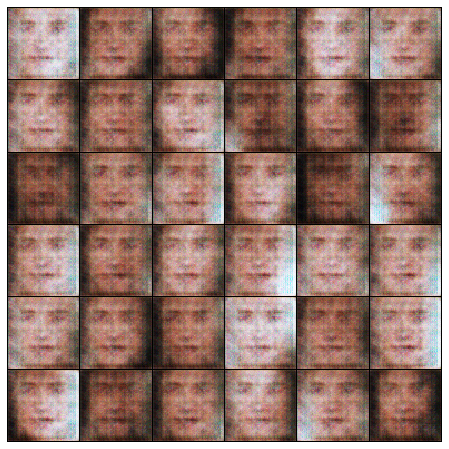

Epoch [3 / 20] G loss: 5.047107696533203 D loss: 0.32638800144195557


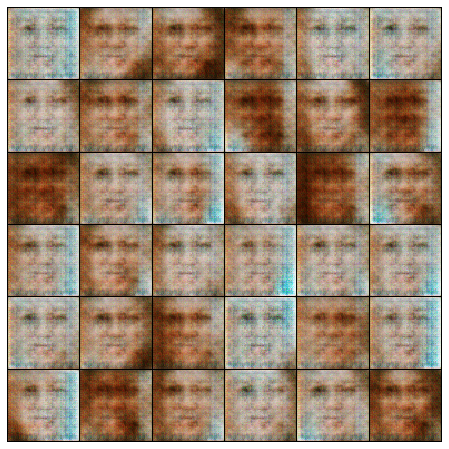

Epoch [4 / 20] G loss: 4.443949222564697 D loss: 0.5700387954711914


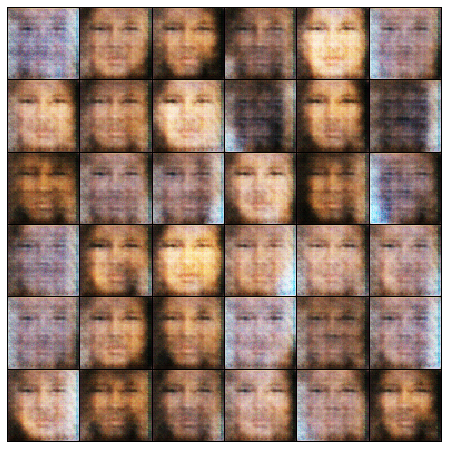

Epoch [5 / 20] G loss: 4.922927379608154 D loss: 0.5746982097625732


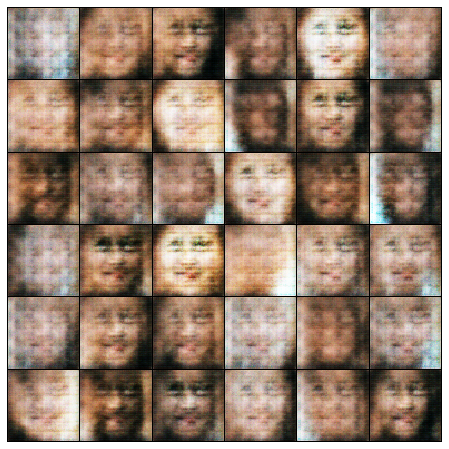

Epoch [6 / 20] G loss: 3.438642740249634 D loss: 0.5388248562812805


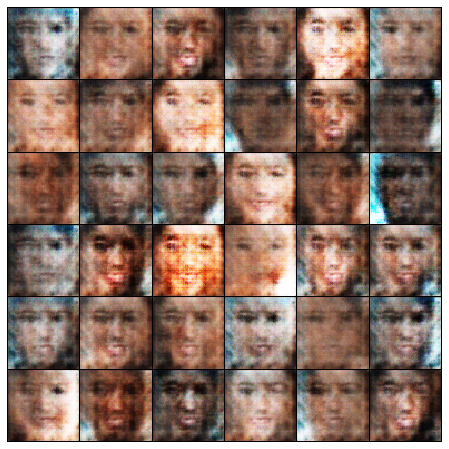

Epoch [7 / 20] G loss: 4.15584135055542 D loss: 0.6062374114990234


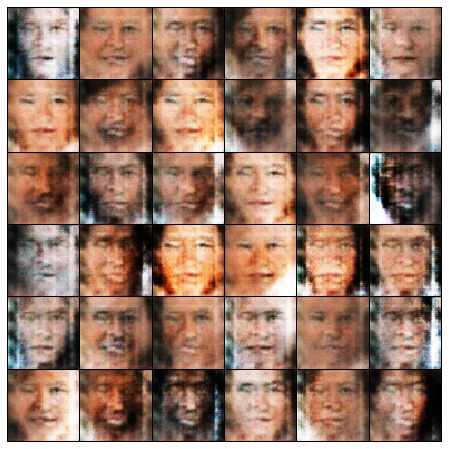

Epoch [8 / 20] G loss: 7.091630935668945 D loss: 1.0587254762649536


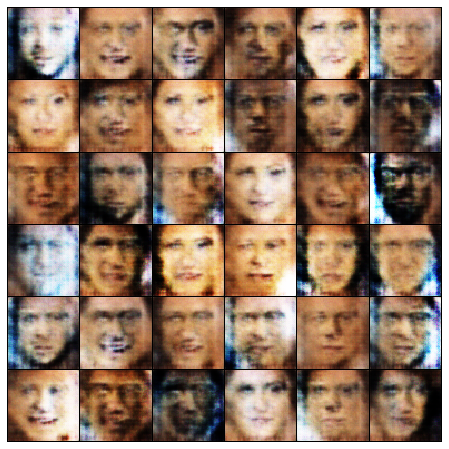

Epoch [9 / 20] G loss: 6.090262413024902 D loss: 0.6211434602737427


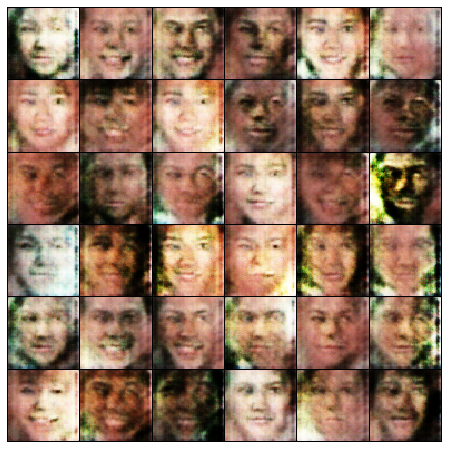

Epoch [10 / 20] G loss: 8.989286422729492 D loss: 1.4998342990875244


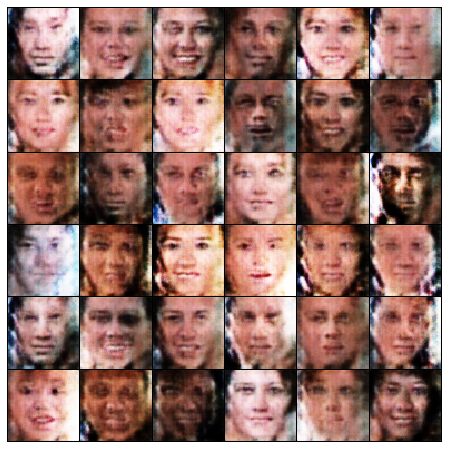

Epoch [11 / 20] G loss: 2.4109015464782715 D loss: 0.806881308555603


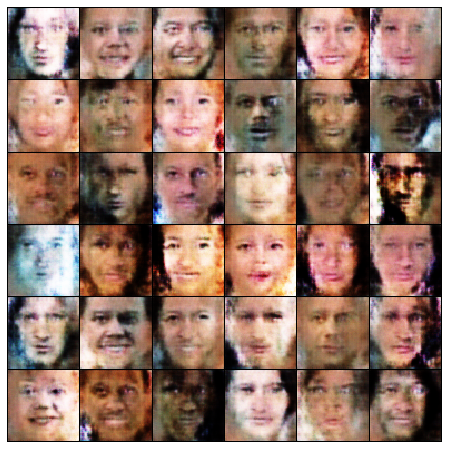

Epoch [12 / 20] G loss: 3.665670871734619 D loss: 0.41314369440078735


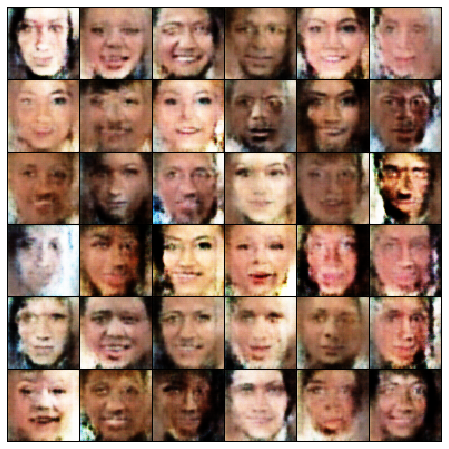

Epoch [13 / 20] G loss: 3.063297986984253 D loss: 0.44303780794143677


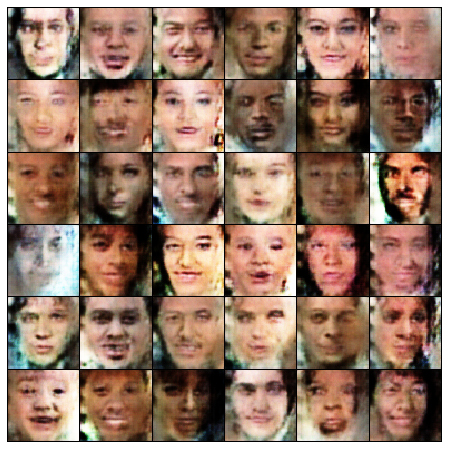

Epoch [14 / 20] G loss: 2.7457215785980225 D loss: 0.520877480506897


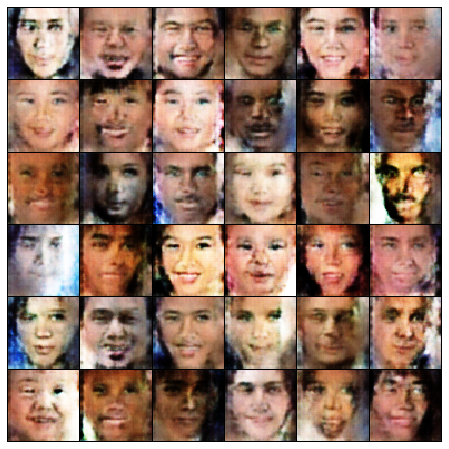

Epoch [15 / 20] G loss: 4.406310558319092 D loss: 0.7397065162658691


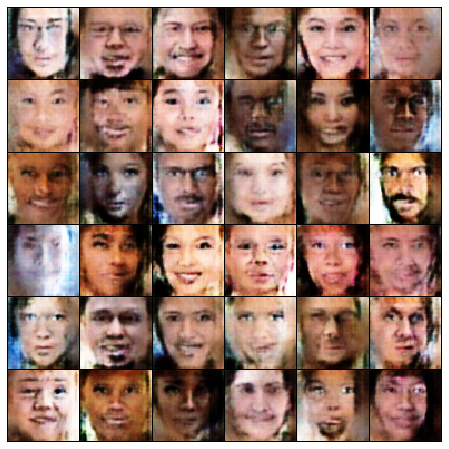

Epoch [16 / 20] G loss: 1.8331860303878784 D loss: 0.5571194291114807


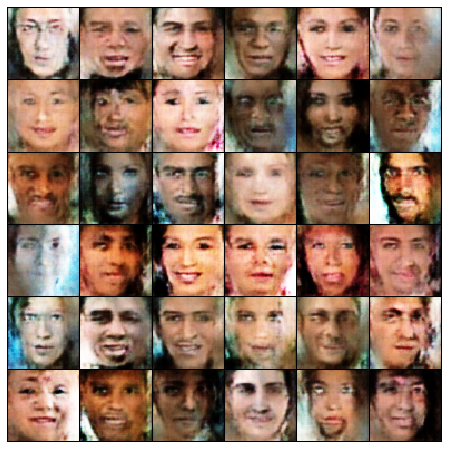

Epoch [17 / 20] G loss: 2.968557357788086 D loss: 0.5598468780517578


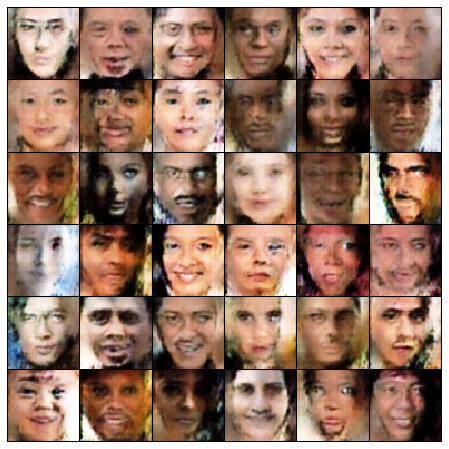

Epoch [18 / 20] G loss: 3.9381675720214844 D loss: 0.4190978407859802


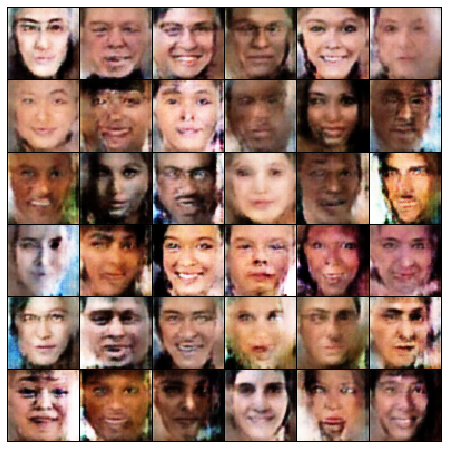

Epoch [19 / 20] G loss: 4.130819797515869 D loss: 0.5987802147865295


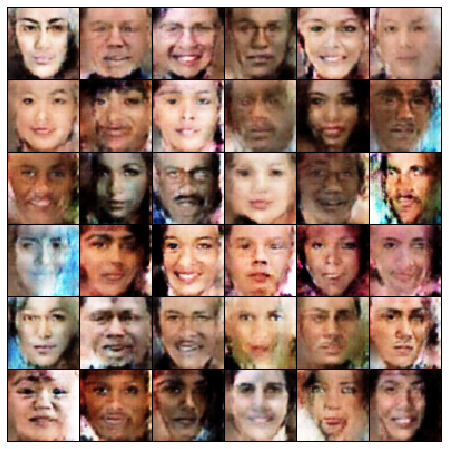

Epoch [20 / 20] G loss: 5.7584638595581055 D loss: 1.2528467178344727


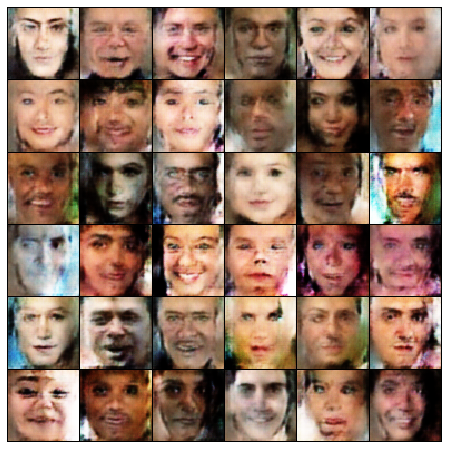

Avg per epoch time: 91.69 sec, total 20 epochs time: 30.75 min
Training finished!
...saving training results


In [91]:
#######################################################################################################
# TODO 5a: Fill code for training setup
#######################################################################################################
# define loss function: binary cross-entropy
loss = nn.BCELoss()
# define networks
initial_mean = 0
initial_std = 0.02
fake_label = 0
real_label = 1
G = Generator(initial_mean,initial_std).to(device)
D = Discriminator(initial_mean,initial_std).to(device)

# define optimizers
# lr=10e-4 at the beginning
G_optimizer = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
D_optimizer = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999)) 

# results save folder
if not os.path.isdir(result_dir):
    os.mkdir(result_dir)
if not os.path.isdir(result_dir+'/Random'):
    os.mkdir(result_dir+'/Random')
if not os.path.isdir(result_dir+'/Fixed'):
    os.mkdir(result_dir+'/Fixed')

progress = {}
progress['D_losses'] = []
progress['G_losses'] = []
progress['per_epoch_times'] = []
progress['total_time'] = []
num_iter = 0

# start training loop
print('Training ...')
start_time = time.time()
for epoch in range(num_epochs):
    
    D_losses = []
    G_losses = []
    
    epoch_start_time = time.time()
    for real, _ in data_loader:
        real = real.to(device)
        batch_size = real.size(0)
        # real_label = 1
        r_label = torch.full((batch_size,), real_label).to(device)
        f_label = torch.full((batch_size,), fake_label).to(device)
        #######################################################################################################
        # TODO 5b: Fill code for training loop
        ######################################################################################################
        # generate random latent vector z and real and fake labels 
        z = torch.randn(batch_size,100,1,1).to(device)
        # generate fakes
        fakes = G(z)
        # evaluate fakes
        f_output = D(fakes.detach()).view(-1)
        error_fake_D = loss(f_output, f_label)
        # evaluate real minibatch
        r_output = D(real).view(-1)
        error_real_D = loss(r_output, r_label)
        # accumulate discriminator loss from the information about the real and fake images it just saw
        D_train_loss = error_fake_D + error_real_D   
        # train discriminator D step
        D.zero_grad()
        D_train_loss.backward()
        D_optimizer.step()    
        
        # train generator to output an image that is classified as real 
        f_output = D(fakes).view(-1)
        # calculate the difference between real label and pic generated
        G_train_loss = loss(f_output, r_label)  
        G.zero_grad()
        # train generator G step
        G_train_loss.backward()
        G_optimizer.step()              

        D_losses.append(D_train_loss.data.item())
        G_losses.append(G_train_loss.data.item())
#         if num_iter % 100 ==0:
#             print('Iteration {}/{} G loss: {} D loss: {}'.format(num_iter, len(data_loader), G_train_loss, D_train_loss))

        num_iter += 1

    epoch_end_time = time.time()
    per_epoch_time = epoch_end_time - epoch_start_time
    
    print('Epoch [{} / {}] G loss: {} D loss: {}'.format(epoch + 1, num_epochs, G_train_loss, D_train_loss))

    show_result( epoch, save=True, path=result_dir + '/Random/{}_DCGAN_{}.png'.format(dset_name, epoch), useFixed=False )
    show_result( epoch, save=True, show=True, path=result_dir + '/Fixed/{}_DCGAN_{}.png'.format(dset_name, epoch), useFixed=True )
    progress['D_losses'].append(torch.mean(torch.FloatTensor(D_losses)))
    progress['G_losses'].append(torch.mean(torch.FloatTensor(G_losses)))
    progress['per_epoch_times'].append(per_epoch_time)

end_time = time.time()
total_time = end_time - start_time
progress['total_time'].append(total_time)

print('Avg per epoch time: {:.2f} sec, total {:d} epochs time: {:.2f} min'.format(torch.mean(torch.FloatTensor(progress['per_epoch_times'])), num_epochs, total_time / 60))
print('Training finished!')
print('...saving training results')

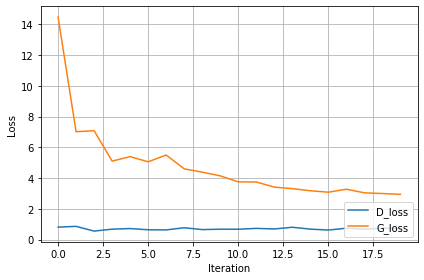

In [92]:
torch.save(G.state_dict(), result_dir + '/generator_network.pkl')
torch.save(D.state_dict(), result_dir + '/discriminator_network.pkl')
with open(result_dir + '/progress.pkl', 'wb') as f:
    pickle.dump(progress, f)

# plot the loss curves    
plot_losses(progress, save=True, path=result_dir + '/{}_DCGAN_progress.png'.format(dset_name))

# Visualize the training progress as an animated GIF
images = []
for e in range(num_epochs):
    img_name = result_dir + '/Fixed/{}_DCGAN_{}.png'.format(dset_name, e)
    images.append(imageio.imread(img_name))
imageio.mimsave(result_dir + '/DCGAN_generation_animation.gif', images, fps=5)

### Display the animated generation GIF

% **TODO: edit path to GIF** %

<img src='full_path_to_gif.gif' width="512">

### 6) Explore the latent space of the generator (5 points)
We now want to **explore the expressiveness** of the Generator. Intuitively, a small change in values of the latent vector $z$ should result in a small change in the output image, and a linear interpolation between two latent vectors $z_1$ and $z_2$ should yield a reasonably smooth transition from one valid output image to another. Implement a function that creates a grid of latent vectors, where each row is an interpolation from the leftmost to the rightmost latent vector, with $n$ interpolation steps.

The expected output of this function should look like this (or better): 


<img src="./img/latent_space_morph_MNIST.png" width="900">
<img src="./img/latent_space_morph_fashionMNIST.png" width="900">

### 7) Modify the network to output $64\times64$ RGB images (10 points)

Download `UTK_face.tar.gz` from [Google Drive](https://drive.google.com/drive/folders/0BxYys69jI14kU0I1YUQyY1ZDRUE) and extract the images to your working directory in the folder `./data/UTKFace/train`. This dataset [4] contains approximately 24K cropped images of human faces of mixed age, gender and race.

Load these images and resize them to the dimensions you want to generate ($64\times64$ RGB images). Replicate and modify your Generator and Discriminator network architectures in order to output the appropriate image size and three color channels. You may want to consult the [original DCGAN paper](https://arxiv.org/abs/1511.06434) to check what their suggested architecture looks like. You should generate an output similar to this (or better):

<img src="img/DCGAN_faces.png" width="900">



You can either modify the code above, or copy the necessary code pieces, but **make sure you include all results** of different datasets in your final report or in this notebook.

In [20]:
#######################################################################################################
# TODO 7: resize the images such that they have the shape of 3x64x64
#######################################################################################################
transform = transforms.Compose([
                    transforms.Resize(64),
                    transforms.CenterCrop(64),
                    transforms.ToTensor(),
    # the pictures in minist dataset is grayscaled, which means there is only one sigle channel
                    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))])

# the directory structure has to be ./data/train/imageFileName
train_dataset = torchvision.datasets.ImageFolder(
    root='./data/UTKFace',
    transform=transform
)

print("Dataset length: ", len(train_dataset))
print("Image size: {}".format(train_dataset[0][0].size()))
print("value range: [ {} - {} ]".format(torch.min(train_dataset[0][0]), torch.max(train_dataset[0][0])))

Dataset length:  23708
Image size: torch.Size([3, 64, 64])
value range: [ -0.9607843160629272 - 0.9921568632125854 ]


### 8) Create a latent space walk of the Face Generator you trained (5 points)
To that end, generate as many random latents as your animation has number of frames. Then, use a gaussian filter on those latents in order to create a smooth blending between adjacent frames in the animation. Have a look at `scipy.ndimage.gaussian_filter` for that purpose. Make sure that your animation can loop endlessly, i.e. the last frames and the first frames of the animation also blend. The $\sigma$ value of the gaussian filter defines how many frames are blended; use the given parameter values of the function to control this value.<br>
Your output should look like this (or better):

<img src='img/Faces_DCGAN_latent_walk_1.gif' style='margin: 0px 10px' align='left' width="128">

<img src='img/Faces_DCGAN_latent_walk_2.gif' style='margin: 0px 10px' align='left' width="128">

<img src='img/Faces_DCGAN_latent_walk_3.gif' style='margin: 0px 10px' align='left' width="128">

In [ ]:
generator_path = './myDataset_UTKFace_20_256_DCGAN/generator_network.pkl'
G = Generator(0,0.02)
G.load_state_dict(torch.load(generator_path))
G.eval()
G.to(device)

In [94]:
from scipy.ndimage import gaussian_filter

In [102]:
!pwd

/ibex/scratch/xiongc/CS390DD_project4


In [ ]:
def generate_latent_walk(duration_sec=20.0, smoothing_sec=1.0, fps=30):
    #######################################################################################################
    # TODO 8: create a smoothly interpolated loop through random latent space values
    #######################################################################################################
    latent_vectors = torch.randn(fps,100,1,1)
    latent_vectors = torch.tensor(gaussian_filter(latent_vectors, sigma=fps)).to(device)
    fakes = G(latent_vectors).detach() #TODO create smoothly interpolating images
    fakes = fakes.mul(0.5).add(0.5) #denormalize it's neccessary?
    images = fakes.data.cpu().numpy()
# #     images = images.astype(np.uint8)
#     print(images[0].size)
#     images_list = []
#     img_name = result_dir + '/Fixed/{}_DCGAN_{}.png'.format(dset_name, e)
#     images.append(imageio.imread(img_name))
#     for image in images:
#         images_list.append(np.transpose(image, (1, 2, 0)))
#     imageio.mimsave('./latent_space_walk.gif', images_list, fps=fps)

generate_latent_walk()       

## Assignment 4B: Conditional DCGAN

Our previous Generator network was generating random outputs for each input latent vector without any measure of control over the output. 
Now, we would like to add some control mechanism such that we can determine the class for a generated image, e.g. generate only the number $5$ or images from the category $Shirt$.

The expected output of this GAN should look like this (or better):

<img src="img/cond_DCGAN_MNIST.png" align='left' width="550">
<img src="img/cond_DCGAN_fashionMNIST.png" align='left' width="550">

For simplicity, we will use either _MNIST_ or _FashionMNIST_ at $32\times32$ grayscale for this exercise again.

For a class-conditioned output, we need to modify both the generator as well as the discriminator network to accept a class label as part of the input. These labels need to be transformed from a "categorical" input to a numerical vector. Use `torch.nn.Embedding` to transform the label to such an embedding space.

### 8) Modify Networks for conditional GANs (4 points)

Select appropriate training hyperparameters.

In [ ]:
# TODO: choose reasonable values
batch_size = 0
num_epochs = 0
learning_rate = 0

### 9) Design a conditional discriminator network (8 points)

Below diagrams shows the architecture that you're expected to implement

<img src="img/DCGAN_discriminator_conditional.png" align='left' width="900">

In [ ]:
#######################################################################################################
#TODO 9: update the discriminator network to incorporate the label input
#######################################################################################################

class Discriminator(nn.Module):
    def __init__(self, n_classes=10):
        super().__init__()
        pass # TODO
    
    def forward(self, input, labels):
        # TODO implement forward pass
        return None

### 8) Design a conditional generator network (8 points)

<img src="img/DCGAN_generator_conditional.png" align='left' width="900">

In [ ]:
#######################################################################################################
#TODO 10: update the generator network to incorporate the label input
#######################################################################################################

class Generator(nn.Module):
    def __init__(self, n_classes=10):
        super().__init__()
        pass # TODO
    
    def forward(self, input, labels):
        # TODO implement forward pass   
        return None

#### Complete the output function (5 points)

In [ ]:
# output generated samples from the current state of the generator network
n_samples = 5

#######################################################################################################
# TODO 11: generate a fixed noise vector and a fixed set of labels to evaluate the output of the generator
# with the same noise parameters as training progresses.
# Arrange the labels into a grid to show same label outputs in the same column (see example results above) 
#######################################################################################################
fixed_z = None
fixed_labels = None

def show_conditional_result(num_epoch, show=False, save=False, n_classes=10, n_samples=5, path='result.png', useFixed=False):
    with torch.no_grad():
        if useFixed:   
            fake = G(fixed_z, fixed_labels).cpu()
        else:
            # TODO generate a new random noise vector and a grid of labels
            z = None
            labels = None

            fake = G(z, labels).cpu()

        fig, ax = plt.subplots(figsize=(20, 10))
        image = utils.make_grid(fake.data, n_classes, 1)

        plt.imshow(np.transpose(image, (1, 2, 0)))

        ax.axis('off')

        plt.savefig(path)

        if show:
            plt.show()
        else:
            plt.close()   

#### Complete the training setup (5 points) and training loop (10 points)

In [ ]:
plt.ion()

# define dataloader
data_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

result_dir = '{}_conditional_DCGAN'.format(dset_name)

# results save folder
if not os.path.isdir(result_dir):
    os.mkdir(result_dir)
    
device = torch.device("cuda:0")

#######################################################################################################
# TODO 12: define training setup
#######################################################################################################

# TODO define networks
G = None
D = None

# TODO define optimizers
G_optimizer = None
D_optimizer = None 

progress = {}
progress['D_losses'] = []
progress['G_losses'] = []
progress['per_epoch_times'] = []
progress['total_time'] = []
num_iter = 0

# start training loop
print('Training ...')
start_time = time.time()
for epoch in range(num_epochs):
    
    D_losses = []
    G_losses = []
    
    epoch_start_time = time.time()
    num_batches = 0
    
    for real, real_labels in data_loader:
        
        #######################################################################################################
        # TODO 13: Fill code for training loop
        #######################################################################################################

        # generate random latent vector z and random class assignments for each generated image in the minibatch as well as real and fake labels 
    
        # TODO 
        
        # generate fakes    

        # TODO 
        
        # evaluate fakes
        
        # TODO 

        # evaluate real minibatch
         
        # TODO
        
        # accumulate discriminator loss from the information about the real and fake images it just saw
        
        D_train_loss = None         

        # train discriminator D step
        D.zero_grad()
        D_train_loss.backward()
        D_optimizer.step() 
        
        # train generator to output an image that is classified as real              
        G_train_loss = None     
        
        # train generator G step
        G.zero_grad()
        G_train_loss.backward()
        G_optimizer.step()              

        D_losses.append(D_train_loss.data.item())
        G_losses.append(G_train_loss.data.item())
        
        epoch_end_time = time.time()
    per_epoch_time = epoch_end_time - epoch_start_time
    
    print('Epoch [{} / {}] G loss: {} D loss: {}'.format(epoch + 1, num_epochs, G_train_loss, D_train_loss))

    show_conditional_result( epoch, save=True, show=True, path=result_dir + '/{}_conditional_DCGAN_{}.png'.format(dset_name, epoch), useFixed=True )
    progress['D_losses'].append(torch.mean(torch.FloatTensor(D_losses)))
    progress['G_losses'].append(torch.mean(torch.FloatTensor(G_losses)))
    progress['per_epoch_times'].append(per_epoch_time)
     
end_time = time.time()
total_time = end_time - start_time
progress['total_time'].append(total_time)

print('Avg per epoch time: {:.2f} sec, total {:d} epochs time: {:.2f} min'.format(torch.mean(torch.FloatTensor(progress['per_epoch_times'])), num_epochs, total_time / 60))
print('Training finished!')
print('...saving training results')

torch.save(G.state_dict(), result_dir + '/generator_network.pkl')
torch.save(D.state_dict(), result_dir + '/discriminator_network.pkl')
with open(result_dir + '/progress.pkl', 'wb') as f:
    pickle.dump(progress, f)

# plot loss curves
plot_losses(progress, save=True, path=result_dir + '/{}_DCGAN_progress.png'.format(dset_name))

# show training progress as animation
images = []
for e in range(num_epochs):
    img_name = result_dir + '/{}_conditional_DCGAN_{}.png'.format(dset_name, e)
    images.append(imageio.imread(img_name))
imageio.mimsave(result_dir + '/conditional_DCGAN_generation_animation.gif', images, fps=5)

### Display the animated generation GIF

% **TODO: edit path to GIF** %

<img src='full_path_to_gif.gif' width="512">